#data_read


In [ ]:
## 필요한 패키지 등록
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

#파일을 만든다
dir_save_datasets = os.path.join('./', 'datasets')

if not os.path.exists(dir_save_datasets):
    os.makedirs(dir_save_datasets)

In [ ]:
## 데이터 불러오기
dir_data ='./datasets'

name_label = 'train-labels.tif'
name_input = 'train-volume.tif'

#tif 파일 가지고, 여기 디렉토리에 이름 지어서 열 준비(열어놓는다)
img_label = Image.open(os.path.join(dir_data, name_label))
img_input = Image.open(os.path.join(dir_data, name_input))

ny, nx = img_label.size
nframe = img_label.n_frames

# 전체 이미지 30개를 섞어줌
id_frame = np.arange(nframe)
np.random.shuffle(id_frame)


##
nframe_train = 24
nframe_val = 3
nframe_test = 3

#파일을 만든다
dir_save_train = os.path.join(dir_data, 'train')
dir_save_val = os.path.join(dir_data, 'val')
dir_save_test = os.path.join(dir_data, 'test')

if not os.path.exists(dir_save_train):
    os.makedirs(dir_save_train)

if not os.path.exists(dir_save_val):
    os.makedirs(dir_save_val)

if not os.path.exists(dir_save_test):
    os.makedirs(dir_save_test)


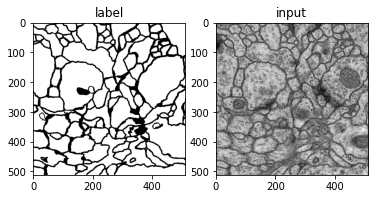

In [ ]:

offset_nframe = 0

# nframe_train는 24

## 선택된 train 이미지를 npy 파일로 저장
#(tif 파일을 1번째.2번째...찾아서 넘파이로 array하고>>이름지어 저장한다)
for i in range(nframe_train):
    img_label.seek(id_frame[i + offset_nframe])
    img_input.seek(id_frame[i + offset_nframe])

#넘파이로 변환
    label_ = np.asarray(img_label)
    input_ = np.asarray(img_input)
#넘파이로 변환한 거 (경로,이름)(넘파이 변환 자료)
    np.save(os.path.join(dir_save_train, 'label_%03d.npy' % i), label_)
    np.save(os.path.join(dir_save_train, 'input_%03d.npy' % i), input_)

## 선택된 val 이미지를 npy 파일로 저장
offset_nframe = nframe_train

for i in range(nframe_val):
    img_label.seek(id_frame[i + offset_nframe])
    img_input.seek(id_frame[i + offset_nframe])

    label_ = np.asarray(img_label)
    input_ = np.asarray(img_input)

    np.save(os.path.join(dir_save_val, 'label_%03d.npy' % i), label_)
    np.save(os.path.join(dir_save_val, 'input_%03d.npy' % i), input_)

## 선택된 test 이미지를 npy 파일로 저장
offset_nframe = nframe_train + nframe_val

for i in range(nframe_test):
    img_label.seek(id_frame[i + offset_nframe])
    img_input.seek(id_frame[i + offset_nframe])

    label_ = np.asarray(img_label)
    input_ = np.asarray(img_input)

    np.save(os.path.join(dir_save_test, 'label_%03d.npy' % i), label_)
    np.save(os.path.join(dir_save_test, 'input_%03d.npy' % i), input_)

##
plt.subplot(121)
plt.imshow(label_, cmap='gray')
plt.title('label')

plt.subplot(122)
plt.imshow(input_, cmap='gray')
plt.title('input')

plt.show()



#train

In [ ]:
## 라이브러리 추가하기
import os
import numpy as np

import torch
import torch.nn as nn
from torch.utils.data import DataLoader

from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt
from torchvision import transforms, datasets

In [ ]:
#파일을 만든다
#(길을 개척해서 만든다)
dir_save_ckpt = os.path.join('./', 'checkpoint')
dir_save_log = os.path.join('./', 'log')
dir_save_results = os.path.join('./', 'results')

if not os.path.exists(dir_save_ckpt):
    os.makedirs(dir_save_ckpt)

if not os.path.exists(dir_save_log):
    os.makedirs(dir_save_log)

if not os.path.exists(dir_save_results):
    os.makedirs(dir_save_results)

In [ ]:
## 트레이닝 파라메터 설정하기
lr = 1e-3
batch_size = 4
num_epoch = 40

dir_data ='./datasets'
ckpt_dir = './checkpoint'
log_dir = './log'
result_dir = './results'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## 네트워크 구축하기

## Model ##
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        def CBR2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=True):
            layers = []
            layers += [nn.Conv2d(in_channels=in_channels, out_channels=out_channels,
                                 kernel_size=kernel_size, stride=stride, padding=padding,
                                 bias=bias)]
            layers += [nn.BatchNorm2d(num_features=out_channels)]
            layers += [nn.ReLU()]

            cbr = nn.Sequential(*layers)

            return cbr

        # Contracting path
        self.enc1_1 = CBR2d(in_channels=1, out_channels=64)
        self.enc1_2 = CBR2d(in_channels=64, out_channels=64)

        self.pool1 = nn.MaxPool2d(kernel_size=2)

        self.enc2_1 = CBR2d(in_channels=64, out_channels=128)
        self.enc2_2 = CBR2d(in_channels=128, out_channels=128)

        self.pool2 = nn.MaxPool2d(kernel_size=2)

        self.enc3_1 = CBR2d(in_channels=128, out_channels=256)
        self.enc3_2 = CBR2d(in_channels=256, out_channels=256)

        self.pool3 = nn.MaxPool2d(kernel_size=2)

        self.enc4_1 = CBR2d(in_channels=256, out_channels=512)
        self.enc4_2 = CBR2d(in_channels=512, out_channels=512)

        self.pool4 = nn.MaxPool2d(kernel_size=2)

        self.enc5_1 = CBR2d(in_channels=512, out_channels=1024)

        # Expansive path
        self.dec5_1 = CBR2d(in_channels=1024, out_channels=512)

        self.unpool4 = nn.ConvTranspose2d(in_channels=512, out_channels=512,
                                          kernel_size=2, stride=2, padding=0, bias=True)

        self.dec4_2 = CBR2d(in_channels=2 * 512, out_channels=512)
        self.dec4_1 = CBR2d(in_channels=512, out_channels=256)

        self.unpool3 = nn.ConvTranspose2d(in_channels=256, out_channels=256,
                                          kernel_size=2, stride=2, padding=0, bias=True)

        self.dec3_2 = CBR2d(in_channels=2 * 256, out_channels=256)
        self.dec3_1 = CBR2d(in_channels=256, out_channels=128)

        self.unpool2 = nn.ConvTranspose2d(in_channels=128, out_channels=128,
                                          kernel_size=2, stride=2, padding=0, bias=True)

        self.dec2_2 = CBR2d(in_channels=2 * 128, out_channels=128)
        self.dec2_1 = CBR2d(in_channels=128, out_channels=64)

        self.unpool1 = nn.ConvTranspose2d(in_channels=64, out_channels=64,
                                          kernel_size=2, stride=2, padding=0, bias=True)

        self.dec1_2 = CBR2d(in_channels=2 * 64, out_channels=64)
        self.dec1_1 = CBR2d(in_channels=64, out_channels=64)

        self.fc = nn.Conv2d(in_channels=64, out_channels=1, kernel_size=1, stride=1, padding=0, bias=True)

    def forward(self, x):
        enc1_1 = self.enc1_1(x)
        enc1_2 = self.enc1_2(enc1_1)
        pool1 = self.pool1(enc1_2)

        enc2_1 = self.enc2_1(pool1)
        enc2_2 = self.enc2_2(enc2_1)
        pool2 = self.pool2(enc2_2)

        enc3_1 = self.enc3_1(pool2)
        enc3_2 = self.enc3_2(enc3_1)
        pool3 = self.pool3(enc3_2)

        enc4_1 = self.enc4_1(pool3)
        enc4_2 = self.enc4_2(enc4_1)
        pool4 = self.pool4(enc4_2)

        enc5_1 = self.enc5_1(pool4)

        dec5_1 = self.dec5_1(enc5_1)

        unpool4 = self.unpool4(dec5_1)
        cat4 = torch.cat((unpool4, enc4_2), dim=1)
        dec4_2 = self.dec4_2(cat4)
        dec4_1 = self.dec4_1(dec4_2)

        unpool3 = self.unpool3(dec4_1)
        cat3 = torch.cat((unpool3, enc3_2), dim=1)
        dec3_2 = self.dec3_2(cat3)
        dec3_1 = self.dec3_1(dec3_2)

        unpool2 = self.unpool2(dec3_1)
        cat2 = torch.cat((unpool2, enc2_2), dim=1)
        dec2_2 = self.dec2_2(cat2)
        dec2_1 = self.dec2_1(dec2_2)

        unpool1 = self.unpool1(dec2_1)
        cat1 = torch.cat((unpool1, enc1_2), dim=1)
        dec1_2 = self.dec1_2(cat1)
        dec1_1 = self.dec1_1(dec1_2)

        x = self.fc(dec1_1)

        return x

In [ ]:
## 데이터 로더를 구현하기

## dataset (dataset & transform) ##

class Dataset(torch.utils.data.Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform

        lst_data = os.listdir(self.data_dir)


#lst_data에 label,input 라고 마크 된 것을 따로 모은다

# 문자열 검사해서 'label'이 있으면 True 
# 문자열 검사해서 'input'이 있으면 True
        lst_label = [f for f in lst_data if f.startswith('label')]
        lst_input = [f for f in lst_data if f.startswith('input')]

        lst_label.sort()
        lst_input.sort()

#label,input 라고 마크 된 것을 모아서 self 한다
        self.lst_label = lst_label
        self.lst_input = lst_input

    def __len__(self):
        return len(self.lst_label)

#label,input 따로 정리되어 있는 것을 만들어서 numpy화한다
    def __getitem__(self, index):
      # 로드를 하면 어레이 내용을 화면에 보여줌
        label = np.load(os.path.join(self.data_dir, self.lst_label[index]))
        input = np.load(os.path.join(self.data_dir, self.lst_input[index]))

      #정규화 한다
        label = label/255.0
        input = input/255.0

        if label.ndim == 2:
            label = label[:, :, np.newaxis]
        if input.ndim == 2:
            input = input[:, :, np.newaxis]

        data = {'input': input, 'label': label}

# transform이 정의되어 있다면 transform을 거친 데이터를 불러옴
        if self.transform:
            data = self.transform(data)

        return data




## transform 구현하기
class ToTensor(object):
    def __call__(self, data):
        label, input = data['label'], data['input']
#tensor로 할려면 (채널,y,x)
        label = label.transpose((2, 0, 1)).astype(np.float32)
        input = input.transpose((2, 0, 1)).astype(np.float32)
#torch.from_numpy
        data = {'label': torch.from_numpy(label), 'input': torch.from_numpy(input)}

        return data

class Normalization(object):
    def __init__(self, mean=0.5, std=0.5):
        self.mean = mean
        self.std = std

    def __call__(self, data):
        label, input = data['label'], data['input']

        input = (input - self.mean) / self.std

        data = {'label': label, 'input': input}

        return data

class RandomFlip(object):
    def __call__(self, data):
        label, input = data['label'], data['input']

        if np.random.rand() > 0.5:
            label = np.fliplr(label)
            input = np.fliplr(input)

        if np.random.rand() > 0.5:
            label = np.flipud(label)
            input = np.flipud(input)

        data = {'label': label, 'input': input}

        return data

In [ ]:
# 데이터로더 잘 구현되었는지 확인
dataset_train = Dataset(data_dir=dir_save_train)
data = dataset_train.__getitem__(0) # 한 이미지 불러오기
input = data['input']
label = data['label']

# 불러온 이미지 시각화
plt.subplot(122)
plt.imshow(label.reshape(512,512), cmap='gray')
plt.title('label')

plt.subplot(121)
plt.imshow(input.reshape(512,512), cmap='gray')
plt.title('input')

plt.show()

In [ ]:
## 네트워크 학습하기 
transform = transforms.Compose([Normalization(mean=0.5, std=0.5), RandomFlip(), ToTensor()])
# transform 적용해서 데이터 셋 불러오기
dataset_train = Dataset(data_dir=os.path.join('./datasets', 'train'), transform=transform)
dataset_val = Dataset(data_dir=os.path.join('./datasets', 'val'), transform=transform)

# 불러온 데이터셋, 배치 size줘서 DataLoader 해주기
loader_train = DataLoader(dataset_train, batch_size=batch_size, shuffle=True, num_workers=8)
loader_val = DataLoader(dataset_val, batch_size=batch_size, shuffle=False, num_workers=8)

## 네트워크 생성하기
net = UNet().to(device)

## 손실함수 정의하기
fn_loss = nn.BCEWithLogitsLoss().to(device)

## Optimizer 설정하기
optim = torch.optim.Adam(net.parameters(), lr=lr)

# 그밖에 부수적인 variables 설정하기
num_data_train = len(dataset_train)
num_batch_train = np.ceil(num_data_train / batch_size)

num_data_val = len(dataset_val)
num_batch_val = np.ceil(num_data_val / batch_size)

## 그 밖에 부수적인 functions 설정하기
fn_tonumpy = lambda x: x.to('cpu').detach().numpy().transpose(0, 2, 3, 1) # device 위에 올라간 텐서를 detach 한 뒤 numpy로 변환
fn_denorm = lambda x, mean, std: (x * std) + mean
fn_class = lambda x: 1.0 * (x > 0.5) # threshold 0.5 기준으로 indicator function으로 classifier 구현


## Tensorboard 를 사용하기 위한 SummaryWriter 설정
writer_train = SummaryWriter(log_dir=os.path.join(log_dir, 'train'))
writer_val = SummaryWriter(log_dir=os.path.join(log_dir, 'val'))


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
# 트랜스폼 잘 구현되었는지 확인
transform = transforms.Compose([Normalization(mean=0.5, std=0.5), RandomFlip(), ToTensor()])
dataset_train = Dataset(data_dir=dir_save_train, transform=transform)
data = dataset_train.__getitem__(0) # 한 이미지 불러오기
input = data['input']
label = data['label']

# 불러온 이미지 시각화
plt.subplot(122)
plt.hist(label.flatten(), bins=20)
plt.title('label')

plt.subplot(121)
plt.hist(input.flatten(), bins=20)
plt.title('input')

plt.tight_layout()
plt.show()

In [ ]:
## util (Network's Save & load) ##

## 네트워크 저장하기
# train을 마친 네트워크 ckpt_dir에 저장 
# net : 네트워크 파라미터, optim  두개를 dict 형태로 저장
def save(ckpt_dir, net, optim, epoch):
    if not os.path.exists(ckpt_dir):
        os.makedirs(ckpt_dir)

    torch.save({'net': net.state_dict(), 'optim': optim.state_dict()},
               "./%s/model_epoch%d.pth" % (ckpt_dir, epoch))

## 네트워크 불러오기
def load(ckpt_dir, net, optim):
    # 저장된 네트워크가 없다면 인풋을 그대로 반환
    if not os.path.exists(ckpt_dir): 
        epoch = 0
        return net, optim, epoch
    #ckpt_dir 아래 있는 모든 파일 리스트를 받아온다
    ckpt_lst = os.listdir(ckpt_dir) 
    #int(''.join(filter(str.isdigit, f)))=ex)'25일 전', '1249 views' 등 에서 숫자인 25, 1249 만 뽑아낼 때,
    ckpt_lst.sort(key=lambda f: int(''.join(filter(str.isdigit, f))))

    dict_model = torch.load('./%s/%s' % (ckpt_dir, ckpt_lst[-1]))

    net.load_state_dict(dict_model['net'])
    optim.load_state_dict(dict_model['optim'])
    epoch = int(ckpt_lst[-1].split('epoch')[1].split('.pth')[0])

    return net, optim, epoch



In [ ]:
## 네트워크 학습시키기
st_epoch = 0

for epoch in range(st_epoch + 1, num_epoch + 1):
  net.train()
  loss_arr = []

  # 1은 뭐니 > index start point
  for batch, data in enumerate(loader_train, 1):
    # forward pass
    label = data['label'].to(device)
    input = data['input'].to(device)
    output = net(input)

    # backward pass
    optim.zero_grad()

    loss = fn_loss(output, label)
    loss.backward()

    optim.step()

    # 손실함수 계산
    loss_arr += [loss.item()]

    print("TRAIN: EPOCH %04d / %04d | BATCH %04d / %04d | LOSS %.4f" %
          (epoch, num_epoch, batch, num_batch_train, np.mean(loss_arr)))

    # Tensorboard 저장하기
    label = fn_tonumpy(label)
    input = fn_tonumpy(fn_denorm(input, mean=0.5, std=0.5))
    output = fn_tonumpy(fn_class(output))

    writer_train.add_image('label', label, num_batch_train * (epoch - 1) + batch, dataformats='NHWC')
    writer_train.add_image('input', input, num_batch_train * (epoch - 1) + batch, dataformats='NHWC')
    writer_train.add_image('output', output, num_batch_train * (epoch - 1) + batch, dataformats='NHWC')

  writer_train.add_scalar('loss', np.mean(loss_arr), epoch)

  
  
  with torch.no_grad():   
     net.eval()
     loss_arr = []
     # 1은 뭐니 > index start point
     for batch, data in enumerate(loader_val, 1):          
       # forward pass
       label = data['label'].to(device)
       input = data['input'].to(device)
       output = net(input)

       # 손실함수 계산하기
       loss = fn_loss(output, label)
       loss_arr += [loss.item()]

       print("VALID: EPOCH %04d / %04d | BATCH %04d / %04d | LOSS %.4f" %
             (epoch, num_epoch, batch, num_batch_val, np.mean(loss_arr)))

       # Tensorboard 저장하기
       label = fn_tonumpy(label)
       input = fn_tonumpy(fn_denorm(input, mean=0.5, std=0.5))
       output = fn_tonumpy(fn_class(output))

       writer_val.add_image('label', label, num_batch_val * (epoch - 1) + batch, dataformats='NHWC')
       writer_val.add_image('input', input, num_batch_val * (epoch - 1) + batch, dataformats='NHWC')
       writer_val.add_image('output', output, num_batch_val * (epoch - 1) + batch, dataformats='NHWC')

  #loss function이 저장
  writer_val.add_scalar('loss', np.mean(loss_arr), epoch)

  #epoch이 한번씩 지날 때마다 네트워크를 저장하도록 기입하기
  if epoch % 10 == 0:
    save(ckpt_dir=ckpt_dir, net=net, optim=optim, epoch=epoch)


writer_train.close()
writer_val.close()


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


TRAIN: EPOCH 0001 / 0100 | BATCH 0001 / 0006 | LOSS 0.6430
TRAIN: EPOCH 0001 / 0100 | BATCH 0002 / 0006 | LOSS 0.5771
TRAIN: EPOCH 0001 / 0100 | BATCH 0003 / 0006 | LOSS 0.5442
TRAIN: EPOCH 0001 / 0100 | BATCH 0004 / 0006 | LOSS 0.5209
TRAIN: EPOCH 0001 / 0100 | BATCH 0005 / 0006 | LOSS 0.4995
TRAIN: EPOCH 0001 / 0100 | BATCH 0006 / 0006 | LOSS 0.4824
VALID: EPOCH 0001 / 0100 | BATCH 0001 / 0001 | LOSS 0.6007
TRAIN: EPOCH 0002 / 0100 | BATCH 0001 / 0006 | LOSS 0.4415
TRAIN: EPOCH 0002 / 0100 | BATCH 0002 / 0006 | LOSS 0.4092
TRAIN: EPOCH 0002 / 0100 | BATCH 0003 / 0006 | LOSS 0.3907
TRAIN: EPOCH 0002 / 0100 | BATCH 0004 / 0006 | LOSS 0.3815
TRAIN: EPOCH 0002 / 0100 | BATCH 0005 / 0006 | LOSS 0.3741
TRAIN: EPOCH 0002 / 0100 | BATCH 0006 / 0006 | LOSS 0.3692
VALID: EPOCH 0002 / 0100 | BATCH 0001 / 0001 | LOSS 0.4912
TRAIN: EPOCH 0003 / 0100 | BATCH 0001 / 0006 | LOSS 0.3290
TRAIN: EPOCH 0003 / 0100 | BATCH 0002 / 0006 | LOSS 0.3225
TRAIN: EPOCH 0003 / 0100 | BATCH 0003 / 0006 | LOSS 0.32

In [ ]:
%load_ext tensorboard

In [ ]:
tensorboard --logdir='/content/log'

<IPython.core.display.Javascript object>

**훈련된 모델 테스트하기**

In [ ]:
transform = transforms.Compose([Normalization(mean=0.5, std=0.5), ToTensor()])

dataset_test = Dataset(data_dir=os.path.join(data_dir, 'test'), transform=transform)
loader_test = DataLoader(dataset_test, batch_size=batch_size, shuffle=False, num_workers=8)

# 그밖에 부수적인 variables 설정하기
num_data_test = len(dataset_test)
num_batch_test = np.ceil(num_data_test / batch_size)

# 결과 디렉토리 생성하기
result_dir = os.path.join(base_dir, 'result')
if not os.path.exists(result_dir):
    os.makedirs(os.path.join(result_dir, 'png'))
    os.makedirs(os.path.join(result_dir, 'numpy'))


net, optim, st_epoch = load(ckpt_dir=ckpt_dir, net=net, optim=optim)

with torch.no_grad():
      net.eval()
      loss_arr = []

      for batch, data in enumerate(loader_test, 1):
          # forward pass
          label = data['label'].to(device)
          input = data['input'].to(device)

          output = net(input)

          # 손실함수 계산하기
          loss = fn_loss(output, label)

          loss_arr += [loss.item()]

          print("TEST: BATCH %04d / %04d | LOSS %.4f" %
                (batch, num_batch_test, np.mean(loss_arr)))

          # Tensorboard 저장하기
          label = fn_tonumpy(label)
          input = fn_tonumpy(fn_denorm(input, mean=0.5, std=0.5))
          output = fn_tonumpy(fn_class(output))

          # 테스트 결과 저장하기
          for j in range(label.shape[0]):
              id = num_batch_test * (batch - 1) + j

              plt.imsave(os.path.join(result_dir, 'png', 'label_%04d.png' % id), label[j].squeeze(), cmap='gray')
              plt.imsave(os.path.join(result_dir, 'png', 'input_%04d.png' % id), input[j].squeeze(), cmap='gray')
              plt.imsave(os.path.join(result_dir, 'png', 'output_%04d.png' % id), output[j].squeeze(), cmap='gray')

              np.save(os.path.join(result_dir, 'numpy', 'label_%04d.npy' % id), label[j].squeeze())
              np.save(os.path.join(result_dir, 'numpy', 'input_%04d.npy' % id), input[j].squeeze())
              np.save(os.path.join(result_dir, 'numpy', 'output_%04d.npy' % id), output[j].squeeze())

print("AVERAGE TEST: BATCH %04d / %04d | LOSS %.4f" %
        (batch, num_batch_test, np.mean(loss_arr)))

In [ ]:
##### 결과 시각화하기 #####


lst_data = os.listdir(os.path.join(result_dir, 'numpy'))

lst_label = [f for f in lst_data if f.startswith('label')]
lst_input = [f for f in lst_data if f.startswith('input')]
lst_output = [f for f in lst_data if f.startswith('output')]

lst_label.sort()
lst_input.sort()
lst_output.sort()

##
id = 0

label = np.load(os.path.join(result_dir,"numpy", lst_label[id]))
input = np.load(os.path.join(result_dir,"numpy", lst_input[id]))
output = np.load(os.path.join(result_dir,"numpy", lst_output[id]))

## 플롯 그리기
plt.figure(figsize=(8,6))
plt.subplot(131)
plt.imshow(input, cmap='gray')
plt.title('input')

plt.subplot(132)
plt.imshow(label, cmap='gray')
plt.title('label')

plt.subplot(133)
plt.imshow(output, cmap='gray')
plt.title('output')

plt.show()